## AI Safety & Robustness

Deep Neural Networks are a very powerful tool to recognize patterns in data, and, for example, perform image classification on a human-level. However, we have not tested yet how robust these models actually are. Can we “trick” the model and find failure modes? Can we design images that the networks naturally classify incorrectly? Due to the high classification accuracy on unseen test data, we would expect that this can be difficult. However, in 2014, a research group at Google and NYU showed that deep CNNs can be easily fooled, just by adding some salient but carefully constructed noise to the images.

In this tutorial, we will discuss adversarial attacks on deep image classification models. The following topics are covered:
+ Create high-performance Deep CNN on ImageNet
+ White-box adversarial attacks (FGSM, PGD)
+ Black-box attacks
+ Targeted vs. untargeted attacks(Universial Adversarial Patch)
+ Transferability of white-box attacks

##### Dataset
We select 5000 images from the original ImageNet Dataset, which contains 1000 classes and the shape of image is as same as the original sample, i.e., 3\*224\*224

In [ ]:
# Download necessary dataset and import packages
# wget http://cs231n.stanford.edu/tiny-imagenet-200.zip

## Standard libraries
import os
import json
import math
import time
import numpy as np
import scipy.linalg
import sys
import copy

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.set()

# Progress bar
from tqdm.notebook import tqdm

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim

# Torchvision
import torchvision
from torchvision.datasets import CIFAR10
from torchvision.models import resnet34, ResNet34_Weights
from torchvision import models, utils, datasets, transforms
from PIL import Image

# Path to the folder where the datasets are/should be downloaded
DATASET_PATH = '/cs/academic/phd3/xinrzhen/xinran/TA/dataset/tiny-imagenet-200'

# Path to save checkpoints
CHECKPOINT_PATH = '/cs/academic/phd3/xinrzhen/xinran/TA/checkpoint/'


# set the seed and ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.manual_seed(0)
np.random.seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device: ", device)


Using device:  cuda


/tmp/ipykernel_764451/1270017116.py:18: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export


In [ ]:
# Prepare dataset
import urllib.request
from urllib.error import HTTPError
import zipfile
# Github URL where the dataset is stored for this tutorial
base_url = "https://raw.githubusercontent.com/phlippe/saved_models/main/tutorial10/"
# Files to download
pretrained_files = [(DATASET_PATH, "TinyImageNet.zip"), (CHECKPOINT_PATH, "patches.zip")]
# Create checkpoint path if it doesn't exist yet
os.makedirs(DATASET_PATH, exist_ok=True)
os.makedirs(CHECKPOINT_PATH, exist_ok=True)

# For each file, check whether it already exists. If not, try downloading it.
for dir_name, file_name in pretrained_files:
    file_path = os.path.join(dir_name, file_name)
    if not os.path.isfile(file_path):
        file_url = base_url + file_name
        print(f"Downloading {file_url}...")
        try:
            urllib.request.urlretrieve(file_url, file_path)
        except HTTPError as e:
            print("Something went wrong. Please try to download the file from the GDrive folder, or contact the author with the full output including the following error:\n", e)
        if file_name.endswith(".zip"):
            print("Unzipping file...")
            with zipfile.ZipFile(file_path, 'r') as zip_ref:
                zip_ref.extractall(file_path.rsplit("/",1)[0])

##### Evaluate CNN model
Before we evaluate the robustness of the model. we need to have a high-performance model to do the classification task. Here, we use common CNN architecture (ResNet34) and you can load the pre-trained parameter from the checkpoint we provided. Feel free to experiment with other architectures as well, the code is mainly independent of the specific architecture we choose.

In [ ]:
# Load CNN architecture pretrained on ImageNet
os.environ["TORCH_HOME"] = CHECKPOINT_PATH
pretrained_model = resnet34(weights=ResNet34_Weights.IMAGENET1K_V1)
pretrained_model = pretrained_model.to(device)

# No gradients needed for the network
pretrained_model.eval()
for p in pretrained_model.parameters():
    p.requires_grad = False

In [ ]:
# Mean and Std from ImageNet
NORM_MEAN = np.array([0.485, 0.456, 0.406])
NORM_STD = np.array([0.229, 0.224, 0.225])
# No resizing and center crop necessary as images are already preprocessed.
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=NORM_MEAN,
                         std=NORM_STD)
])

# Load dataset and create data loader
imagenet_path = os.path.join(DATASET_PATH, "TinyImageNet/")
assert os.path.isdir(imagenet_path), f"Could not find the ImageNet dataset at expected path \"{imagenet_path}\". " + \
                                     f"Please make sure to have downloaded the ImageNet dataset here, or change the {DATASET_PATH=} variable."
dataset = torchvision.datasets.ImageFolder(root=imagenet_path, transform=plain_transforms)
data_loader = data.DataLoader(dataset, batch_size=32, shuffle=False, drop_last=False, num_workers=8)

# Load label names to interpret the label numbers 0 to 999
def get_label_index(lab_str):
    assert lab_str in label_names, f"Label \"{lab_str}\" not found. Check the spelling of the class."
    return label_names.index(lab_str)

with open(os.path.join(imagenet_path, "label_list.json"), "r") as f:
    label_names = json.load(f)

In [ ]:
# check data
first_batch = next(iter(data_loader))
first_sample, first_label = first_batch
print("First Sample shape:", first_sample.shape)
print("First Label:", first_label)

First Sample shape: torch.Size([32, 3, 224, 224])
First Label: tensor([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4, 4, 4,
        4, 5, 5, 5, 5, 5, 6, 6])


##### Evaluate the performance of the model
As ImageNet has 1000 classes, simply looking at the accuracy is not sufficient to tell the performance of a model. Here, we use top-1 and top-5 error rates as evaluation metrics for Tiny ImageNet to reflect the model's performance in both precise classification (top-1, where the predicted label must exactly match the ground truth) and more flexible scenarios (top-5, where the ground truth label only needs to appear within the top 5 predicted classes), providing a comprehensive assessment of the model's accuracy, especially in tasks with high label ambiguity or a large number of categories.

In [ ]:
def eval_model(dataset_loader, img_func=None):
    tp, tp_5, counter = 0., 0., 0.
    for imgs, labels in tqdm(dataset_loader, desc="Validating..."):
        imgs = imgs.to(device)
        labels = labels.to(device)
        if img_func is not None:
            imgs = img_func(imgs, labels)
        with torch.no_grad():
            preds = pretrained_model(imgs)
        tp += (preds.argmax(dim=-1) == labels).sum()
        tp_5 += (preds.topk(5, dim=-1)[1] == labels[...,None]).any(dim=-1).sum()
        counter += preds.shape[0]
    acc = tp.float().item()/counter
    top5 = tp_5.float().item()/counter
    print(f"Top-1 error: {(100.0 * (1 - acc)):4.2f}%")
    print(f"Top-5 error: {(100.0 * (1 - top5)):4.2f}%")
    return acc, top5

_ = eval_model(data_loader)

Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

Top-1 error: 19.14%
Top-5 error: 4.30%


##### Check the prediction
The ResNet34 achives a decent error rate of 4.3% for the top-5 predictions. Next, we can look at some predictions of the model to get more familiar with the dataset. The function below plots an image along with a bar diagram of its predictions. We also prepare it to show adversarial examples for later applications.

The bar plot on the right shows the top-5 predictions of the model with their class probabilities. We denote the class probabilities with “confidence” as it somewhat resembles how confident the network is that the image is of one specific class. Some of the images have a highly peaked probability distribution, and we would expect the model to be rather robust against noise for those.

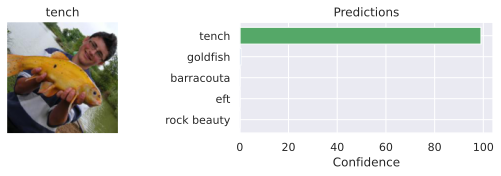

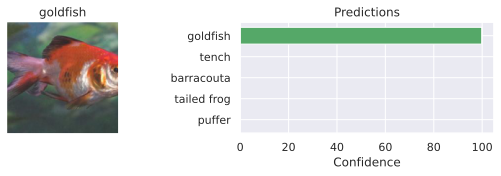

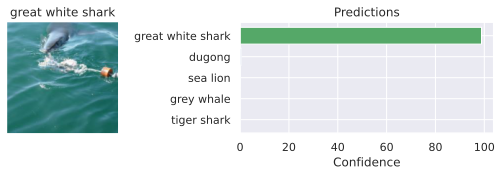

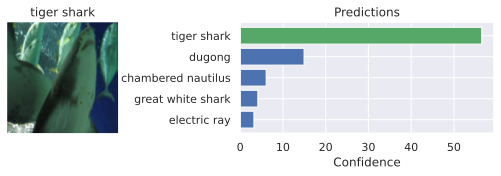

In [ ]:
def show_prediction(img, label, pred, K=5, adv_img=None, noise=None):

    if isinstance(img, torch.Tensor):
        # Tensor image to numpy
        img = img.cpu().permute(1, 2, 0).numpy()
        img = (img * NORM_STD[None,None]) + NORM_MEAN[None,None]
        img = np.clip(img, a_min=0.0, a_max=1.0)
        label = label.item()

    # Plot on the left the image with the true label as title.
    # On the right, have a horizontal bar plot with the top k predictions including probabilities
    if noise is None or adv_img is None:
        fig, ax = plt.subplots(1, 2, figsize=(10,2), gridspec_kw={'width_ratios': [1, 1]})
    else:
        fig, ax = plt.subplots(1, 5, figsize=(12,2), gridspec_kw={'width_ratios': [1, 1, 1, 1, 2]})

    ax[0].imshow(img)
    ax[0].set_title(label_names[label])
    ax[0].axis('off')

    if adv_img is not None and noise is not None:
        # Visualize adversarial images
        adv_img = adv_img.cpu().permute(1, 2, 0).numpy()
        adv_img = (adv_img * NORM_STD[None,None]) + NORM_MEAN[None,None]
        adv_img = np.clip(adv_img, a_min=0.0, a_max=1.0)
        ax[1].imshow(adv_img)
        ax[1].set_title('Adversarial')
        ax[1].axis('off')
        # Visualize noise
        noise = noise.cpu().permute(1, 2, 0).numpy()
        noise = noise * 0.5 + 0.5 # Scale between 0 to 1
        ax[2].imshow(noise)
        ax[2].set_title('Noise')
        ax[2].axis('off')
        # buffer
        ax[3].axis('off')

    if abs(pred.sum().item() - 1.0) > 1e-4:
        pred = torch.softmax(pred, dim=-1)
    topk_vals, topk_idx = pred.topk(K, dim=-1)
    topk_vals, topk_idx = topk_vals.cpu().numpy(), topk_idx.cpu().numpy()
    ax[-1].barh(np.arange(K), topk_vals*100.0, align='center', color=["C0" if topk_idx[i]!=label else "C2" for i in range(K)])
    ax[-1].set_yticks(np.arange(K))
    ax[-1].set_yticklabels([label_names[c] for c in topk_idx])
    ax[-1].invert_yaxis()
    ax[-1].set_xlabel('Confidence')
    ax[-1].set_title('Predictions')

    plt.show()
    plt.close()

exmp_batch, label_batch = next(iter(data_loader))
with torch.no_grad():
    preds = pretrained_model(exmp_batch.to(device))
for i in range(1,17,5):
    show_prediction(exmp_batch[i], label_batch[i], preds[i])

Although we have obtained good performance on the example ImageNet dataset based on ResNet34 , the emergence of adversarial attacks misleads the classification. It misleads the classification results by adding small perturbations to the input.

#### Adversarial Attacks
Adversarial attacks are classified into white-box, gray-box, and black-box based on the attacker's knowledge of the target model. White-box attacks have full access to model parameters and gradients, enabling precise perturbations; gray-box attacks have partial knowledge, such as the architecture but not weights; and black-box attacks rely solely on model outputs (e.g., predictions) without any internal access, making them more challenging but applicable to real-world scenarios.

##### White-box adversarial attack
Fast Gradient Sign Method (FGSM): \
White-box attacks are widely studied due to their simplicity and effectiveness, as they leverage full access to the target model’s gradients. A prime example is the Fast Gradient Sign Method (FGSM). The Fast Gradient Sign Method (FGSM) is a white-box adversarial attack that perturbs input data by leveraging the model's gradient to maximize the loss, generating adversarial examples with the formula:
$$
x^{\prime}=x+\epsilon \cdot \operatorname{sign}\left(\nabla_x L(x, y)\right)
$$
where $x$ is the input, $L(x,y)$ is the loss, $y$ is the label, and $\epsilon$ controls the pertubation magnitude. We change the input image in the direction of maximizing the loss. This is exactly the other way round as during training, where we try to minimize the loss. The sign function and $\epsilon$ can be seen as gradient clipping and learning rate specifically. We only allow our attack to change each pixel value by $\epsilon$. You can also see that the attack can be performed very fast, as it only requires a single forward and backward pass.


In [ ]:
def fast_gradient_sign_method(model, imgs, labels, epsilon=0.02):
    # Determine prediction of the model
    inp_imgs = imgs.clone().requires_grad_()
    preds = model(inp_imgs.to(device))
    preds = F.log_softmax(preds, dim=-1)
    # Calculate loss by NLL
    loss = -torch.gather(preds, 1, labels.to(device).unsqueeze(dim=-1))
    loss.sum().backward()
    # Update image to adversarial example as written above
    noise_grad = torch.sign(inp_imgs.grad.to(imgs.device))
    fake_imgs = imgs + epsilon * noise_grad
    fake_imgs.detach_()
    return fake_imgs, noise_grad

The default value of $\epsilon=0.02$ corresponds to changing a pixel value by about 1 in the range of 0 to 255 , e.g. changing 127 to 128 . This difference is marginal and can often not be recognized by humans. Let's try it below on our example images:

When we add small perturbations to the images, the model makes classification errors even if the images we see with the naked eye do not change.


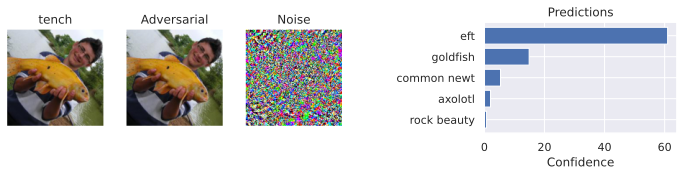

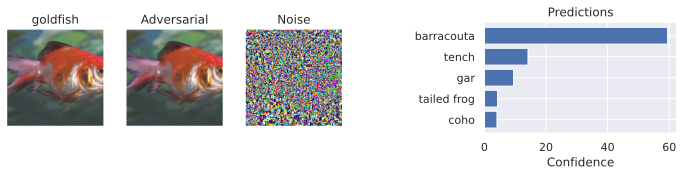

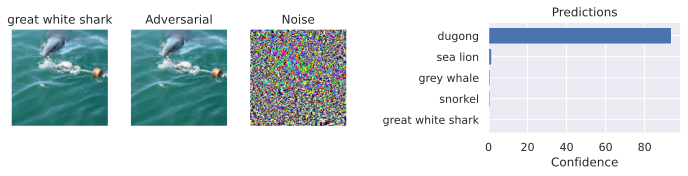

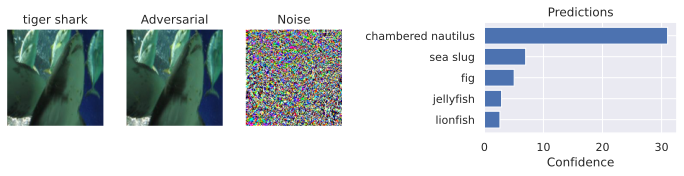

In [ ]:
adv_imgs, noise_grad = fast_gradient_sign_method(pretrained_model, exmp_batch, label_batch, epsilon=0.02)
with torch.no_grad():
    adv_preds = pretrained_model(adv_imgs.to(device))

for i in range(1,17,5):
    show_prediction(exmp_batch[i], label_batch[i], adv_preds[i], adv_img=adv_imgs[i], noise=noise_grad[i])

From the classification result, none of the labels have made it into the top-5 for the four images, showing that we indeed fooled the model. We can also check the accuracy of the model on the adversarial images:

In [ ]:
_ = eval_model(data_loader, img_func=lambda x, y: fast_gradient_sign_method(pretrained_model, x, y, epsilon=0.02)[0])

Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

Top-1 error: 93.62%
Top-5 error: 60.56%


As expected, the model is fooled on almost every image at least for the top-1 error, and more than half don’t have the true label in their top-5. This is a quite significant difference compared to the error rate of 4.3% on the clean images. However, note that the predictions remain semantically similar. For instance, in the images we visualized above, the tench is still recognized as another fish, as well as the great white shark being a dugong. FGSM could be adapted to increase the probability of a specific class instead of minimizing the probability of a label.

This leaves us with the question of how to perturb the image to our desired category?

#### Exercise 1: Determine the target class
+ From the definition, FGSM finds perturbation which increases the loss for the true class and subsequently that leads to misclassification, which is a non-targeted method. We can easily convert it into targeted method by maximizing probability $P(y_{target}|x)$. The only change we need to make is that instead of adding perturbation to the original input, now we need to remove it from the original input. By ‘subtracting’ the perturbations, the inputs are actually moved closer to the decision boundary of the target category, making the model more likely to assign the inputs to that category.
+ How to choose the target class? There are two ways. One is to use a random class as a target class. Another and recommended way is to use class to which our model assigned lowest probability. It is also known as least likely class. Here, we will use random class.

In [ ]:
y_target = 28   #leopard
y_target = torch.tensor([y_target]*exmp_batch.shape[0], device=device)

In [ ]:
def fast_gradient_sign_method_targeted(model, imgs, target_labels, epsilon=0.02):
    """
    One-step targeted class adversarial attack using FGSM.

    Args:
    - model: The target model to attack.
    - imgs: The input images.
    - target_labels: The target class labels for the attack.
    - epsilon: The step size for the perturbation.

    Returns:
    - fake_imgs: The generated adversarial examples.
    - noise_grad: The perturbation applied to the images.
    """
    # Ensure input images require gradients
    inp_imgs = imgs.clone().requires_grad_()

    # Forward pass to get predictions
    preds = model(inp_imgs.to(device))
    preds = F.log_softmax(preds, dim=-1)

    # Calculate loss for target class
    target_labels = target_labels.to(device)
    loss = -torch.gather(preds, 1, target_labels.unsqueeze(dim=-1))
    loss.sum().backward()

    # Generate adversarial examples by subtracting perturbations
    noise_grad = torch.sign(inp_imgs.grad.to(imgs.device))
    fake_imgs = imgs - epsilon * noise_grad  # Subtract to target target class
    fake_imgs.detach_()

    return fake_imgs, noise_grad

In [ ]:
adv_imgs, noise_grad = fast_gradient_sign_method_targeted(pretrained_model, exmp_batch, y_target, epsilon=0.25)

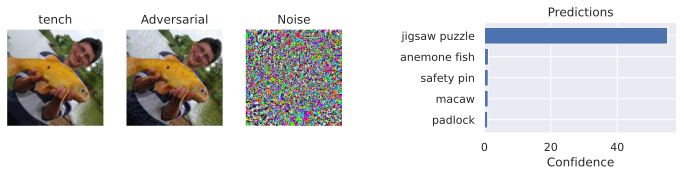

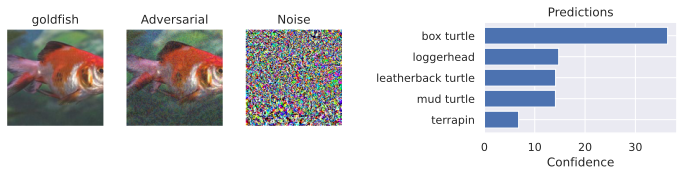

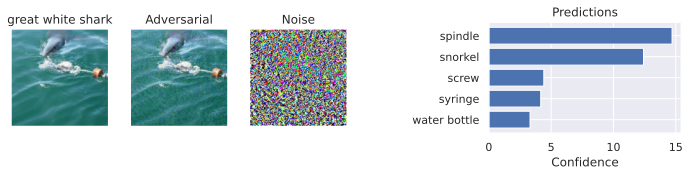

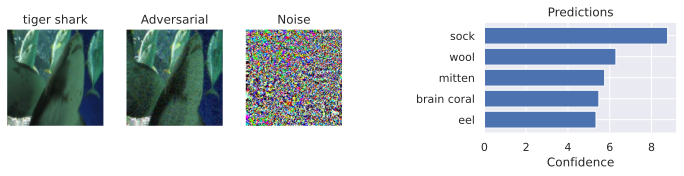

In [ ]:
with torch.no_grad():
    adv_preds = pretrained_model(adv_imgs.to(device))

for i in range(1,17,5):
    show_prediction(exmp_batch[i], label_batch[i], adv_preds[i], adv_img=adv_imgs[i], noise=noise_grad[i])

#### Exercise 2: Iterative Target Class Method (I-FSGM)
We successfully perturbed the output, but it did not change to the target category. This may be because the model only tried to get close to the target category once; an intuitive approach would be to iterate multiple times to get progressively closer to the target category.
+ In each iteration, the input is updated in the opposite direction along the gradient, but the step size of each update is smaller, allowing multiple steps to approximate the target.
+ Each iteration:
$$
x_{\mathrm{adv}}^{t+1}=\operatorname{clip}_{x, \epsilon}\left(x_{\mathrm{adv}}^t-\alpha \cdot \operatorname{sign}\left(\nabla_x \mathcal{L}\left(f(x), y_{\text {target }}\right)\right)\right)
$$
$\alpha$ is the step size of each update. The $\operatorname{clip}_{x, \epsilon}$ ensures that the generated adversarial samples are no more than $\epsilon$ away from the $\ell_{\infty}$ of the original input.

In [ ]:
def iterative_target_class_method(model, imgs, target_labels, epsilon=0.02, alpha=0.005, num_iter=10):
    """
    Iterative targeted class adversarial attack.

    Args:
    - model: The target model to attack.
    - imgs: The input images (original samples).
    - target_labels: The target class labels for the attack.
    - epsilon: Maximum perturbation allowed (L-infinity constraint).
    - alpha: Step size for each iteration.
    - num_iter: Number of iterations to perform.

    Returns:
    - fake_imgs: The generated adversarial examples.
    - noise_grad: The perturbation (gradient direction) applied during the final iteration.
    """
    # Ensure input images are in the proper device
    imgs = imgs.to(device)
    target_labels = target_labels.to(device)

    # Start with the original images
    fake_imgs = imgs.clone()
    noise_grad = None  # Placeholder for the final gradient

    for i in range(num_iter):
        # Set requires_grad for gradient calculation
        fake_imgs.requires_grad_()

        # Forward pass
        preds = model(fake_imgs)
        preds = F.log_softmax(preds, dim=-1)

        # Calculate loss for the target class
        loss = -torch.gather(preds, 1, target_labels.unsqueeze(dim=-1))
        loss.sum().backward()

        # Compute the perturbation
        noise_grad = torch.sign(fake_imgs.grad)

        # Update adversarial examples by subtracting the perturbation
        fake_imgs = fake_imgs - alpha * noise_grad

        # Clamp to ensure within valid pixel range and L-infinity constraint
        fake_imgs = torch.clamp(fake_imgs, imgs - epsilon, imgs + epsilon)
        fake_imgs = torch.clamp(fake_imgs, 0, 1)  # Ensure pixel values are between 0 and 1

        # Detach the tensor to avoid accumulating gradients
        fake_imgs = fake_imgs.detach()

    return fake_imgs, noise_grad


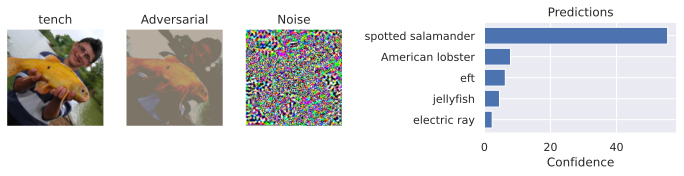

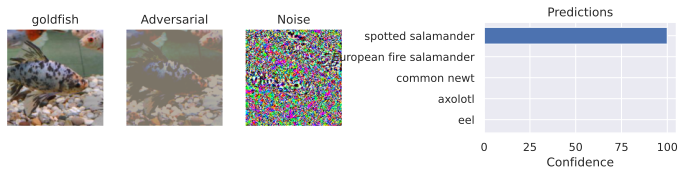

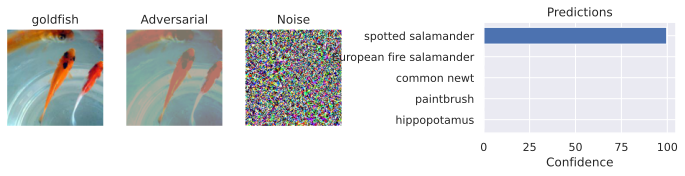

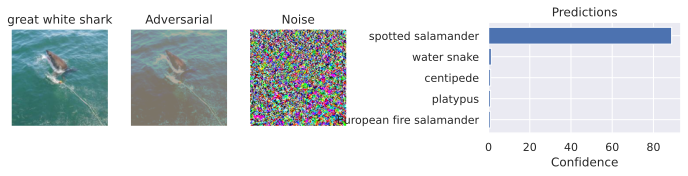

In [ ]:
y_target = 28 #spotted salamander
y_target = torch.tensor([y_target]*exmp_batch.shape[0], device=device)

adv_imgs, noise_grad = iterative_target_class_method(pretrained_model, exmp_batch, y_target, epsilon=0.03, alpha=0.005, num_iter=10)

with torch.no_grad():
    adv_preds = pretrained_model(adv_imgs.to(device))

for i in range(1,17,4):
    show_prediction(exmp_batch[i], label_batch[i], adv_preds[i], adv_img=adv_imgs[i], noise=noise_grad[i])


As you can see, regardless of the original category of the samples, they are classified into the target category (spotted salamander) because of the adversarial attack with high confidence.

##### Constrain the pertubation in the specific region
When revisiting the I-FSGM attack, we find that even though each iteration limits the perturbation to within $\epsilon$ by clipping, the perturbations are superimposed, and through many iterations the perturbation may eventually exceed the limit. This motivates us to construct an attack that ensures that the perturbations strictly adhere to the specified bounds.

Projected Gradient Descent (PGD)
The Projected Gradient Descent (PGD) attack is an iterative extension of FGSM that applies multiple gradient ascent steps to maximize the loss, with each step constrained by a step size $\alpha$, while ensuring the perturbation remains within the $\epsilon$-ball around the original input. Unlike FGSM, which performs a single-step update, PGD refines adversarial examples through iterative optimization, making it more effective at crafting stronger adversarial inputs.


In [ ]:
def projected_gradient_descent(model, imgs, labels, epsilon=0.02, alpha=0.01, num_iter=10):
    """
    Implements the Projected Gradient Descent (PGD) attack.

    Args:
        model (torch.nn.Module): The target model.
        imgs (torch.Tensor): Original input images.
        labels (torch.Tensor): True labels corresponding to the images.
        epsilon (float): Maximum perturbation allowed (L-infinity norm bound).
        alpha (float): Step size for each gradient ascent step.
        num_iter (int): Number of iterations for the attack.

    Returns:
        torch.Tensor: Adversarial images.
        torch.Tensor: Final gradient (noise) applied to the images.
    """
    # Initialize adversarial images with the original images
    adv_imgs = imgs.clone().detach().requires_grad_(True)
    noise_grad = None  # Placeholder for final gradient

    for _ in range(num_iter):
        # Forward pass
        preds = model(adv_imgs.to(device))
        preds = F.log_softmax(preds, dim=-1)

        # Calculate loss
        loss = -torch.gather(preds, 1, labels.to(device).unsqueeze(dim=-1))
        loss.sum().backward()

        # Calculate gradient sign and update adversarial images
        noise_grad = torch.sign(adv_imgs.grad.to(imgs.device))  # Save the gradient
        adv_imgs = adv_imgs + alpha * noise_grad

        # Clip adversarial images to ensure they remain within the epsilon-ball
        adv_imgs = torch.clamp(adv_imgs, imgs - epsilon, imgs + epsilon)
        adv_imgs = torch.clamp(adv_imgs, 0, 1)  # Ensure pixel values are valid
        adv_imgs = adv_imgs.detach().requires_grad_(True)


    return adv_imgs.detach(), noise_grad.detach()


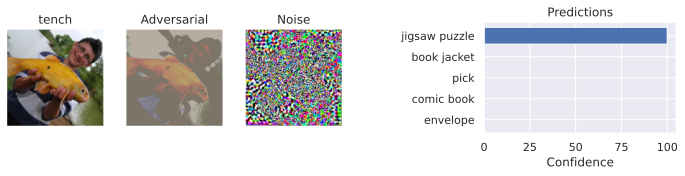

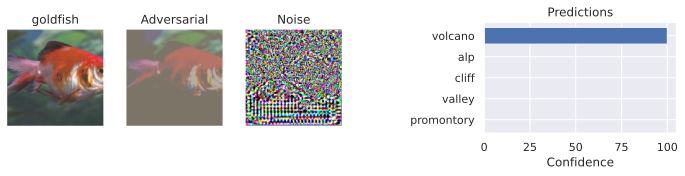

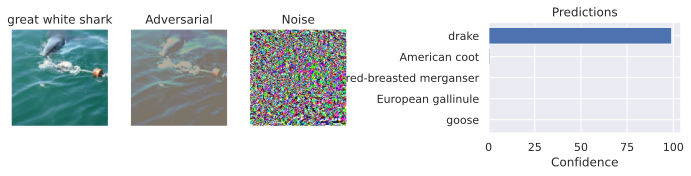

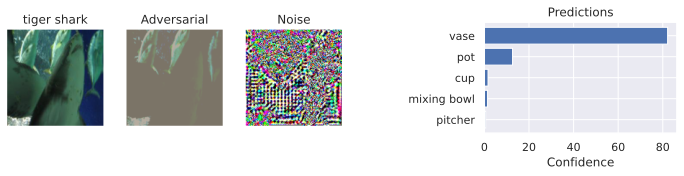

In [ ]:
adv_imgs, noise_grad = projected_gradient_descent(pretrained_model, exmp_batch, label_batch, epsilon=0.02, alpha=0.01, num_iter=10)
with torch.no_grad():
    adv_preds = pretrained_model(adv_imgs.to(device))

for i in range(1,17,5):
    show_prediction(exmp_batch[i], label_batch[i], adv_preds[i], adv_img=adv_imgs[i], noise=noise_grad[i])

In [ ]:
_ = eval_model(data_loader, img_func=lambda x, y: projected_gradient_descent(pretrained_model, x, y, epsilon=0.02, alpha=0.01, num_iter=10)[0])

Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

Top-1 error: 99.40%
Top-5 error: 93.30%


The Projected Gradient Descent (PGD) attack is also non-targeted by default because it aims to maximize the model's loss for the correct class without specifying a target class. To make PGD a targeted attack, you modify the loss function to minimize the model's confidence for the true label and maximize the confidence for a specified target class.

In [ ]:
def targeted_projected_gradient_descent(model, imgs, target_labels, epsilon=0.02, alpha=0.01, num_iter=10):
    """
    Implements the Targeted Projected Gradient Descent (PGD) attack.

    Args:
        model (torch.nn.Module): The target model.
        imgs (torch.Tensor): Original input images.
        target_labels (torch.Tensor): Target class labels for the attack.
        epsilon (float): Maximum perturbation allowed (L-infinity norm bound).
        alpha (float): Step size for each gradient descent step.
        num_iter (int): Number of iterations for the attack.

    Returns:
        torch.Tensor: Adversarial images.
        torch.Tensor: Final gradient (noise) applied to the images.
    """
    # Initialize adversarial images with the original images
    adv_imgs = imgs.clone().detach().requires_grad_(True)
    noise_grad = None  # Placeholder for final gradient

    for _ in range(num_iter):
        # Forward pass
        preds = model(adv_imgs.to(device))
        preds = F.log_softmax(preds, dim=-1)

        # Calculate targeted loss (maximize confidence for target class)
        loss = -torch.gather(preds, 1, target_labels.to(device).unsqueeze(dim=-1))
        loss.sum().backward()

        # Calculate gradient sign and update adversarial images
        noise_grad = torch.sign(adv_imgs.grad.to(imgs.device))  # Save the gradient
        adv_imgs = adv_imgs - alpha * noise_grad  # Note subtraction for targeted attack

        # Clip adversarial images to ensure they remain within the epsilon-ball
        adv_imgs = torch.clamp(adv_imgs, imgs - epsilon, imgs + epsilon)
        adv_imgs = torch.clamp(adv_imgs, 0, 1)  # Ensure pixel values are valid
        adv_imgs = adv_imgs.detach().requires_grad_(True)

    return adv_imgs.detach(), noise_grad.detach()


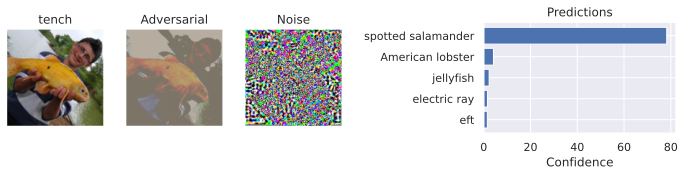

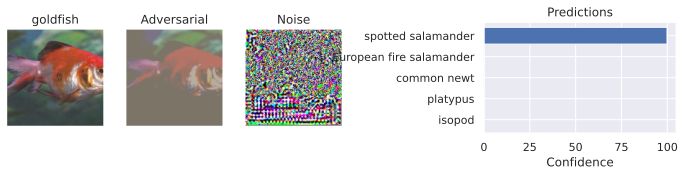

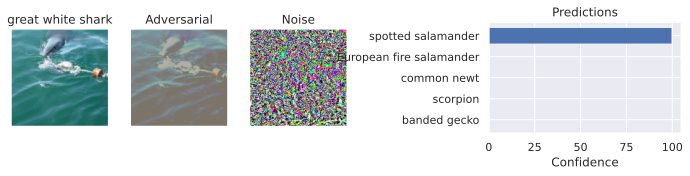

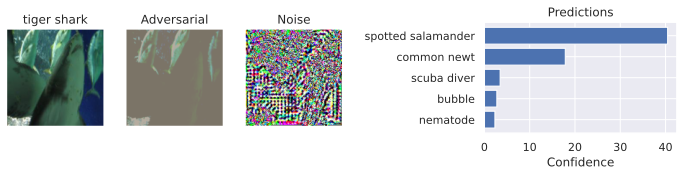

In [ ]:
y_target = 28 #spotted salamander
y_target = torch.tensor([y_target]*exmp_batch.shape[0], device=device)

adv_imgs, noise_grad = targeted_projected_gradient_descent(pretrained_model, exmp_batch, y_target, epsilon=0.04, alpha=0.01, num_iter=10)
with torch.no_grad():
    adv_preds = pretrained_model(adv_imgs.to(device))

for i in range(1,17,5):
    show_prediction(exmp_batch[i], label_batch[i], adv_preds[i], adv_img=adv_imgs[i], noise=noise_grad[i])

##### Adversarial Patches
Instead of changing every pixel by a little bit, we can also try to change a small part of the image into whatever values we would like. In other words, we will create a small image patch that covers a minor part of the original image but causes the model to confidentially predict a specific class we choose. This form of attack is an even bigger threat in real-world applications than FSGM. Imagine a network in an autonomous car that receives a live image from a camera. Another driver could print out a specific pattern and put it on the back of his/her vehicle to make the autonomous car believe that the car is actually a pedestrian. Meanwhile, humans would not notice it. [Tom Brown et al.](https://arxiv.org/pdf/1712.09665.pdf) proposed a way of learning such adversarial image patches robustly in 2017 and provided a short demonstration on [YouTube](https://youtu.be/i1sp4X57TL4). Interestingly, if you add a small picture of the target class (here *toaster*) to the original image, the model does not pick it up at all. A specifically designed patch, however, which only roughly looks like a toaster, can change the network's prediction instantaneously.

[![Adversarial patch in real world](https://img.youtube.com/vi/i1sp4X57TL4/0.jpg)](https://youtu.be/i1sp4X57TL4)

Let's take a closer look at how we can actually train such patches. The general idea is very similar to FSGM in the sense that we calculate gradients for the input, and update our adversarial input correspondingly. However, there are also some differences in the setup. Firstly, we do not calculate a gradient for every pixel. Instead, we replace parts of the input image with our patch and then calculate the gradients just for our patch. Secondly, we don't just do it for one image, but we want the patch to work with any possible image. Hence, we have a whole training loop where we train the patch using SGD. Lastly, image patches are usually designed to make the model predict a specific class, not just any other arbitrary class except the true label. For instance, we can try to create a patch for the class "toaster" and train the patch so that our pretrained model predicts the class "toaster" for any image with the patch in it.

Additionally, to the setup described above, there are a couple of design choices we can take. For instance, [Brown et al.](https://arxiv.org/pdf/1712.09665.pdf) randomly rotated and scaled the patch during training before placing it at a random position in an input image. This makes the patch more robust to small changes and is necessary if we want to fool a neural network in a real-world application. For simplicity, we will only focus on making the patch robust to the location in the image. Given a batch of input images and a patch, we can add the patch as follows:

In [ ]:
def place_patch(img, patch):
    for i in range(img.shape[0]):
        h_offset = np.random.randint(0,img.shape[2]-patch.shape[1]-1)
        w_offset = np.random.randint(0,img.shape[3]-patch.shape[2]-1)
        img[i,:,h_offset:h_offset+patch.shape[1],w_offset:w_offset+patch.shape[2]] = patch_forward(patch)
    return img

The patch itself will be an `nn.Parameter` whose values are in the range between $-\infty$ and $\infty$. Images are, however, naturally limited in their range, and thus we write a small function that maps the parameter into the image value range of ImageNet:

In [ ]:
TENSOR_MEANS, TENSOR_STD = torch.FloatTensor(NORM_MEAN)[:,None,None], torch.FloatTensor(NORM_STD)[:,None,None]
def patch_forward(patch):
    # Map patch values from [-infty,infty] to ImageNet min and max
    patch = (torch.tanh(patch) + 1 - 2 * TENSOR_MEANS) / (2 * TENSOR_STD)
    return patch

Before looking at the actual training code, we can write a small evaluation function. We evaluate the success of a patch by how many times we were able to fool the network into predicting our target class. A simple function for this is implemented below.

In [ ]:
def eval_patch(model, patch, val_loader, target_class):
    model.eval()
    tp, tp_5, counter = 0., 0., 0.
    with torch.no_grad():
        for img, img_labels in tqdm(val_loader, desc="Validating...", leave=False):
            # For stability, place the patch at 4 random locations per image, and average the performance
            for _ in range(4):
                patch_img = place_patch(img, patch)
                patch_img = patch_img.to(device)
                img_labels = img_labels.to(device)
                pred = model(patch_img)
                # In the accuracy calculation, we need to exclude the images that are of our target class
                # as we would not "fool" the model into predicting those
                tp += torch.logical_and(pred.argmax(dim=-1) == target_class, img_labels != target_class).sum()
                tp_5 += torch.logical_and((pred.topk(5, dim=-1)[1] == target_class).any(dim=-1), img_labels != target_class).sum()
                counter += (img_labels != target_class).sum()
    acc = tp/counter
    top5 = tp_5/counter
    return acc, top5

Finally, we can look at the training loop. Given a model to fool, a target class to design the patch for, and a size $k$ of the patch in the number of pixels, we first start by creating a parameter of size $3\times k\times k$. These are the only parameters we will train, and the network itself remains untouched. We use a simple SGD optimizer with momentum to minimize the classification loss of the model given the patch in the image. While we first start with a very high loss due to the good initial performance of the network, the loss quickly decreases once we start changing the patch. In the end, the patch will represent patterns that are characteristic of the class. For instance, if we would want the model to predict a "goldfish" in every image, we would expect the pattern to look somewhat like a goldfish. Over the iterations, the model finetunes the pattern and, hopefully, achieves a high fooling accuracy.

In [ ]:
def patch_attack(model, target_class, patch_size=64, num_epochs=5):
    # Leave a small set of images out to check generalization
    # In most of our experiments, the performance on the hold-out data points
    # was as good as on the training set. Overfitting was little possible due
    # to the small size of the patches.
    train_set, val_set = torch.utils.data.random_split(dataset, [4500, 500])
    train_loader = data.DataLoader(train_set, batch_size=32, shuffle=True, drop_last=True, num_workers=8)
    val_loader = data.DataLoader(val_set, batch_size=32, shuffle=False, drop_last=False, num_workers=4)

    # Create parameter and optimizer
    if not isinstance(patch_size, tuple):
        patch_size = (patch_size, patch_size)
    patch = nn.Parameter(torch.zeros(3, patch_size[0], patch_size[1]), requires_grad=True)
    optimizer = torch.optim.SGD([patch], lr=1e-1, momentum=0.8)
    loss_module = nn.CrossEntropyLoss()

    # Training loop
    for epoch in range(num_epochs):
        t = tqdm(train_loader, leave=False)
        for img, _ in t:
            img = place_patch(img, patch)
            img = img.to(device)
            pred = model(img)
            labels = torch.zeros(img.shape[0], device=pred.device, dtype=torch.long).fill_(target_class)
            loss = loss_module(pred, labels)
            optimizer.zero_grad()
            loss.mean().backward()
            optimizer.step()
            t.set_description(f"Epoch {epoch}, Loss: {loss.item():4.2f}")

    # Final validation
    acc, top5 = eval_patch(model, patch, val_loader, target_class)

    return patch.data, {"acc": acc.item(), "top5": top5.item()}

To get some experience with what to expect from an adversarial patch attack, we want to train multiple patches for different classes. As the training of a patch can take one or two minutes on a GPU, we have provided a couple of pre-trained patches including their results on the full dataset. The results are saved in a JSON file, which is loaded below.

In [ ]:
# Load evaluation results of the pretrained patches
json_results_file = os.path.join(CHECKPOINT_PATH,'hub/checkpoints', "patch_results.json")
json_results = {}
if os.path.isfile(json_results_file):
    with open(json_results_file, "r") as f:
        json_results = json.load(f)

# If you train new patches, you can save the results via calling this function
def save_results(patch_dict):
    result_dict = {cname: {psize: [t.item() if isinstance(t, torch.Tensor) else t
                                   for t in patch_dict[cname][psize]["results"]]
                           for psize in patch_dict[cname]}
                   for cname in patch_dict}
    with open(os.path.join(CHECKPOINT_PATH,'hub/checkpoints', "patch_results.json"), "w") as f:
        json.dump(result_dict, f, indent=4)

Additionally, we implement a function to train and evaluate patches for a list of classes and patch sizes. The pretrained patches include the classes *toaster*, *goldfish*, *school bus*, *lipstick*, and *pineapple*. We chose the classes arbitrarily to cover multiple domains (animals, vehicles, fruits, devices, etc.). We trained each class for three different patch sizes: $32\times32$ pixels, $48\times48$ pixels, and $64\times64$ pixels. We can load them in the two cells below.

In [ ]:
def get_patches(class_names, patch_sizes):
    result_dict = dict()

    # Loop over all classes and patch sizes
    for name in class_names:
        result_dict[name] = dict()
        for patch_size in patch_sizes:
            c = label_names.index(name)
            file_name = os.path.join(CHECKPOINT_PATH,'hub/checkpoints' ,f"{name}_{patch_size}_patch.pt")
            # Load patch if pretrained file exists, otherwise start training
            if not os.path.isfile(file_name):
                patch, val_results = patch_attack(pretrained_model, target_class=c, patch_size=patch_size, num_epochs=5)
                print(f"Validation results for {name} and {patch_size}:", val_results)
                torch.save(patch, file_name)
            else:
                patch = torch.load(file_name)
            # Load evaluation results if exist, otherwise manually evaluate the patch
            if name in json_results:
                results = json_results[name][str(patch_size)]
            else:
                results = eval_patch(pretrained_model, patch, data_loader, target_class=c)

            # Store results and the patches in a dict for better access
            result_dict[name][patch_size] = {
                "results": results,
                "patch": patch
            }

    return result_dict

Feel free to add any additional classes and/or patch sizes.

In [ ]:
class_names = ['toaster', 'goldfish', 'school bus', 'lipstick', 'pineapple']
patch_sizes = [32, 48, 64]

patch_dict = get_patches(class_names, patch_sizes)
# save_results(patch_dict) # Uncomment if you add new class names and want to save the new results

Before looking at the quantitative results, we can actually visualize the patches.

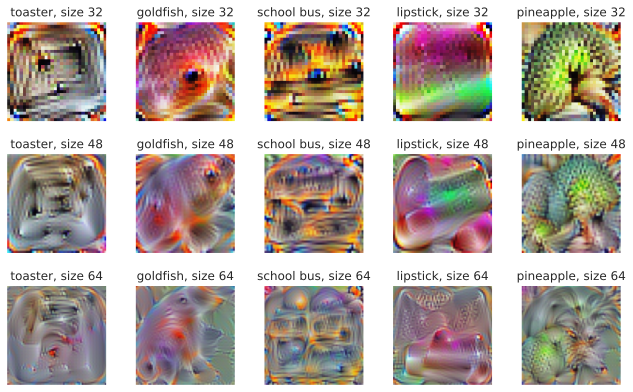

In [ ]:
def show_patches():
    fig, ax = plt.subplots(len(patch_sizes), len(class_names), figsize=(len(class_names)*2.2, len(patch_sizes)*2.2))
    for c_idx, cname in enumerate(class_names):
        for p_idx, psize in enumerate(patch_sizes):
            patch = patch_dict[cname][psize]["patch"]
            patch = (torch.tanh(patch) + 1) / 2 # Parameter to pixel values
            patch = patch.cpu().permute(1, 2, 0).numpy()
            patch = np.clip(patch, a_min=0.0, a_max=1.0)
            ax[p_idx][c_idx].imshow(patch)
            ax[p_idx][c_idx].set_title(f"{cname}, size {psize}")
            ax[p_idx][c_idx].axis('off')
    fig.subplots_adjust(hspace=0.3, wspace=0.3)
    plt.show()
show_patches()

We can see a clear difference between patches of different classes and sizes. In the smallest size, $32\times 32$ pixels, some of the patches clearly resemble their class. For instance, the goldfish patch clearly shows a goldfish. The eye and the color are very characteristic of the class. Overall, the patches with $32$ pixels have very strong colors that are typical for their class (yellow school bus, pink lipstick, greenish pineapple). The larger the patch becomes, the more stretched the pattern becomes. For the goldfish, we can still spot regions that might represent eyes and the characteristic orange color, but it is not clearly a single fish anymore. For the pineapple, we might interpret the top part of the image as the leaves of pineapple fruit, but it is more abstract than our small patches. Nevertheless, we can easily spot the alignment of the patch to class, even on the largest scale.

Let's now look at the quantitative results.

In [ ]:
import tabulate
from IPython.display import display, HTML

def show_table(top_1=True):
    i = 0 if top_1 else 1
    table = [[name] + [f"{(100.0 * patch_dict[name][psize]['results'][i]):4.2f}%" for psize in patch_sizes]
             for name in class_names]
    display(HTML(tabulate.tabulate(table, tablefmt='html', headers=["Class name"] + [f"Patch size {psize}x{psize}" for psize in patch_sizes])))

First, we will create a table of top-1 accuracy, meaning that how many images have been classified with the target class as highest prediction?

In [ ]:
show_table(top_1=True)

Class name,Patch size 32x32,Patch size 48x48,Patch size 64x64
toaster,48.89%,90.48%,98.58%
goldfish,69.53%,93.53%,98.34%
school bus,78.79%,93.95%,98.22%
lipstick,43.36%,86.05%,96.41%
pineapple,79.74%,94.48%,98.72%


The clear trend, that we would also have expected, is that the larger the patch, the easier it is to fool the model. For the largest patch size of $64\times 64$, we are able to fool the model on almost all images, despite the patch covering only 8% of the image. The smallest patch actually covers 2% of the image, which is almost neglectable. Still, the fooling accuracy is quite remarkable. A large variation can be however seen across classes. While *school bus* and *pineapple* seem to be classes that were easily predicted, *toaster* and *lipstick* seem to be much harder for creating a patch. It is hard to intuitively explain why our patches underperform on those classes. Nonetheless, a fooling accuracy of >40% is still very good for such a tiny patch.

Let's also take a look at the top-5 accuracy:

In [ ]:
show_table(top_1=False)

Class name,Patch size 32x32,Patch size 48x48,Patch size 64x64
toaster,72.02%,98.12%,99.93%
goldfish,86.31%,99.07%,99.95%
school bus,91.64%,99.15%,99.89%
lipstick,70.10%,96.86%,99.73%
pineapple,92.23%,99.26%,99.96%


We see a very similar pattern across classes and patch sizes. The patch size $64$ obtains >99.7% top-5 accuracy for any class, showing that we can almost fool the network on any image. A top-5 accuracy of >70% for the hard classes and small patches is still impressive and shows how vulnerable deep CNNs are to such attacks.

Finally, let's create some example visualizations of the patch attack in action.

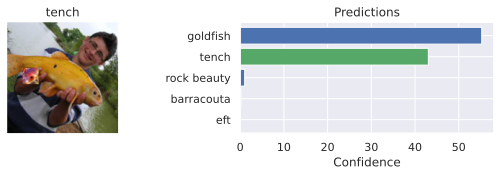

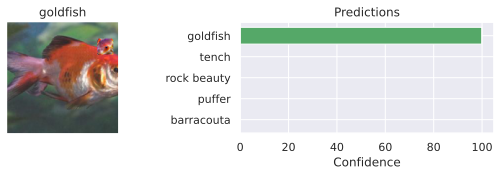

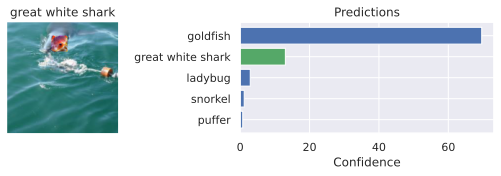

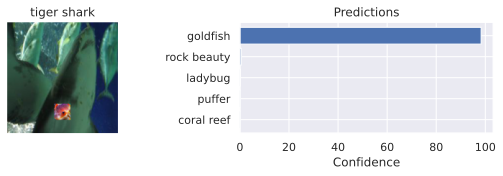

In [ ]:
def perform_patch_attack(patch):
    patch_batch = exmp_batch.clone()
    patch_batch = place_patch(patch_batch, patch)
    with torch.no_grad():
        patch_preds = pretrained_model(patch_batch.to(device))
    for i in range(1,17,5):
        show_prediction(patch_batch[i], label_batch[i], patch_preds[i])

perform_patch_attack(patch_dict['goldfish'][32]['patch'])

The tiny goldfish patch can change all of the predictions to "goldfish" as top class. Note that the patch attacks work especially well if the input image is semantically similar to the target class (e.g. a fish and the target class "goldfish" works better than an airplane image with that patch). Nevertheless, we can also let the network predict semantically dis-similar classes by using a larger patch:

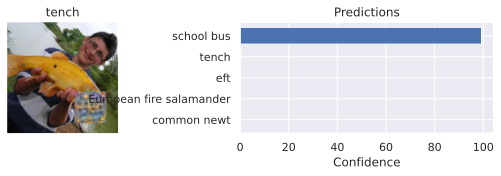

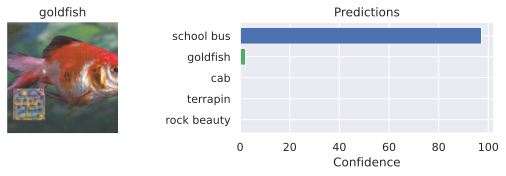

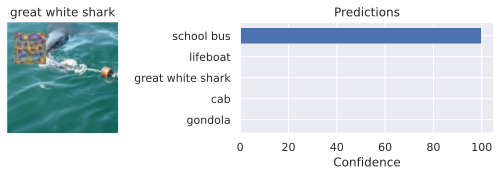

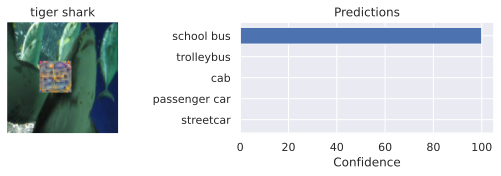

In [ ]:
perform_patch_attack(patch_dict['school bus'][64]['patch'])

Although none of the images have anything to do with an American school bus, the high confidence of often 100% shows how powerful such attacks can be. With a few lines of code and access to the model, we were able to generate patches that we add to any image to make the model predict any class we want.

##### Transferability of white-box attacks

FGSM and the adversarial patch attack were both focused on one specific image. However, can we transfer those attacks to other models? The adversarial patch attack as proposed in [Brown et al.](https://arxiv.org/pdf/1712.09665.pdf), was originally trained on multiple models, and hence was also able to work on many different network architecture. But how different are the patches for different models anyway? For instance, let's evaluate some of our patches trained above on a different network, e.g. DenseNet121.

In [ ]:
transfer_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
transfer_model = transfer_model.to(device)

# No gradients needed for the network
transfer_model.eval()
for p in transfer_model.parameters():
    p.requires_grad = False

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /cs/academic/phd3/xinrzhen/xinran/TA/checkpoint/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 108MB/s] 


Feel free to change the class name and/or patch size below to test out different patches.

In [ ]:
class_name = 'pineapple'
patch_size = 64
print(f"Testing patch \"{class_name}\" of size {patch_size}x{patch_size}")

results = eval_patch(transfer_model,
                     patch_dict[class_name][patch_size]["patch"],
                     data_loader,
                     target_class=label_names.index(class_name))

print(f"Top-1 fool accuracy: {(results[0] * 100.0):4.2f}%")
print(f"Top-5 fool accuracy: {(results[1] * 100.0):4.2f}%")

Testing patch "pineapple" of size 64x64


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

Top-1 fool accuracy: 64.94%
Top-5 fool accuracy: 82.53%


Although the fool accuracy is significantly lower than on the original ResNet34, it still has a considerable impact on DenseNet although the networks have completely different architectures and weights. If you would compare more patches and models, some would work better than others. However, one aspect which allows patch attacks to generalize well is if all the networks have been trained on the same data. In this case, all networks have been trained on ImageNet. Dataset biases make the networks recognize specific patterns in the underlying image data that humans would not have seen, and/or only work for the given dataset. This is why the knowledge of what data has been used to train a specific model is already worth a lot in the context of adversarial attacks.

##### Protecting against adversarial attacks

There are many more attack strategies than just FGSM and adversarial patches that we haven't discussed and implemented ourselves here. However, what about the other perspective? What can we do to *protect* a network against adversarial attacks? The sad truth to this is: not much.

White-box attacks require access to the model and its gradient calculation. The easiest way of preventing this is by ensuring safe, private storage of the model and its weights. However, some attacks, called black-box attacks, also work without access to the model's parameters, or white-box attacks can also generalize as we have seen above on our short test on transferability.

So, how could we eventually protect a model? An intuitive approach would to train/finetune a model on such adversarial images, leading to an adversarial training similar to a GAN. During training, we would pretend to be the attacker, and use for example FGSM as an augmentation strategy. However, this usually just ends up in an oscillation of the defending network between weak spots. Another common trick to increase robustness against adversarial attacks is defensive distillation ([Papernot et al.](https://arxiv.org/pdf/1511.04508.pdf)). Instead of training the model on the dataset labels, we train a secondary model on the softmax predictions of the first one. This way, the loss surface is "smoothed" in the directions an attacker might try to exploit, and it becomes more difficult for the attacker to find adversarial examples. Nevertheless, there hasn't been found the one, true strategy that works against all possible adversarial attacks.

Why are CNNs, or neural networks in general, so vulnerable to adversarial attacks? While there are many possible explanations, the most intuitive is that neural networks don't know what they don't know. Even a large dataset represents just a few sparse points in the extremely large space of possible images. A lot of the input space has not been seen by the network during training, and hence, we cannot guarantee that the prediction for those images is any useful. The network instead learns a very good classification on a smaller region, often referred to as manifold, while ignoring the points outside of it. NNs with uncertainty prediction could potentially help to discover what the network does not know.
Another possible explanation lies in the activation function. As we know, most CNNs use ReLU-based activation functions. While those have enabled great success in training deep neural networks due to their stable gradient for positive values, they also constitute a possible flaw. The output range of a ReLU neuron can be arbitrarily high. Thus, if we design a patch or the noise in the image to cause a very high value for a single neuron, it can overpower many other features in the network. Thus, although ReLU stabilizes training, it also offers a potential point of attack for adversaries.